# Assignment 2: Training

**USE GPU RUNTIME!**

You should already realize that a fast model is usually less accurate. But our requirement is the model need to be both fast and accurate. Thus, the team decided to use PIDNet-S. To improve accuracy it has been decided that wee need to train the model with out dataset (KITTI)

## Step 1. Install MMSegmentation

Just follow the step in the documentation [here](https://mmsegmentation.readthedocs.io/en/latest/get_started.html).

In [1]:
!pip install -U openmim
!mim install mmengine
!mim install "mmcv>=2.0.0"

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.7/52.7 kB 989.0 kB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 14.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 299.2/299.2 kB 24.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 259.5/259.5 kB 16.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.8/62.8 kB 3.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 239.4/239.4 kB 13.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 953.1/953.1 kB 20.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.1/77.1 kB 4.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 143.8/143.8 kB 13.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.7/89.7 kB 9.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 94.0/94.0 kB 15.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━

Looking in links: https://download.openmmlab.com/mmcv/dist/cu121/torch2.1.0/index.html
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 450.4/450.4 kB 6.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 254.7/254.7 kB 10.5 MB/s eta 0:00:00
Looking in links: https://download.openmmlab.com/mmcv/dist/cu121/torch2.1.0/index.html
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 94.1/94.1 MB 7.4 MB/s eta 0:00:00


In [2]:
!pip install ftfy

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.4/53.4 kB 2.0 MB/s eta 0:00:00


In [3]:
!git clone -b main https://github.com/open-mmlab/mmsegmentation.git
!cd mmsegmentation && pip install -e .

Cloning into 'mmsegmentation'...
remote: Enumerating objects: 16412, done.
remote: Counting objects: 100% (85/85), done.
remote: Compressing objects: 100% (78/78), done.
remote: Total 16412 (delta 23), reused 35 (delta 6), pack-reused 16327
Receiving objects: 100% (16412/16412), 43.80 MiB | 29.30 MiB/s, done.
Resolving deltas: 100% (11402/11402), done.
Obtaining file:///content/mmsegmentation
  Preparing metadata (setup.py) ... done
  Running setup.py develop for mmsegmentation


## Step 2. Prepare Dataset

I already provide the script to prepare the dataset, so that you can directly run these cells.

Download data from KITTI.

In [4]:
!wget https://s3.eu-central-1.amazonaws.com/avg-kitti/data_semantics.zip .
!unzip -o data_semantics.zip

--2024-01-14 15:53:05--  https://s3.eu-central-1.amazonaws.com/avg-kitti/data_semantics.zip
Resolving s3.eu-central-1.amazonaws.com (s3.eu-central-1.amazonaws.com)... 52.219.47.227, 52.219.75.15, 52.219.169.65, ...
Connecting to s3.eu-central-1.amazonaws.com (s3.eu-central-1.amazonaws.com)|52.219.47.227|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 327699796 (313M) [application/zip]
Saving to: ‘data_semantics.zip’

data_semantics.zip  100%[===================>] 312.52M  20.3MB/s    in 17s     

2024-01-14 15:53:22 (18.7 MB/s) - ‘data_semantics.zip’ saved [327699796/327699796]

--2024-01-14 15:53:22--  http://./
Resolving . (.)... failed: No address associated with hostname.
wget: unable to resolve host address ‘.’
FINISHED --2024-01-14 15:53:22--
Total wall clock time: 18s
Downloaded: 1 files, 313M in 17s (18.7 MB/s)
Archive:  data_semantics.zip
   creating: testing/
   creating: testing/image_2/
  inflating: testing/image_2/000000_10.png  
  inflating: test

Do the preparation. The preparation consists of several steps:

1. Format images and labels
  - for images: resize and crop the image so that the image size is 512x512
  - for labels: resize and crop the image so that the image size is 512x512, and also convert the labels map so that the road label is changed to 1 (originally road label is 7), whereas the others changed to 0
2. Split the images and labels, and save to the dataset directory. The dataset directory must have the following structure (we are following the same format of default structure of mmseg's Cityscapes dataset)

```
├── data
│   ├── cityscapes
│   │   ├── leftImg8bit
│   │   │   ├── train
│   │   │   │   ├── aaa_leftImg8bit.png
│   │   │   │   ├── bbb_leftImg8bit.png
│   │   │   │   ├── ccc_leftImg8bit.png
│   │   │   ├── val
│   │   │   │   ├── xxx_leftImg8bit.png
│   │   │   │   ├── yyy_leftImg8bit.png
│   │   │   │   ├── zzz_leftImg8bit.png
│   │   ├── gtFine
│   │   │   ├── train
│   │   │   │   ├── aaa_gtFine_labelTrainIds.png
│   │   │   │   ├── bbb_gtFine_labelTrainIds.png
│   │   │   │   ├── ccc_gtFine_labelTrainIds.png
│   │   │   ├── val
│   │   │   │   ├── xxx_gtFine_labelTrainIds.png
│   │   │   │   ├── yyy_gtFine_labelTrainIds.png
│   │   │   │   ├── zzz_gtFine_labelTrainIds.png
```

In [5]:
import os
import random
from pathlib import Path

import cv2
import matplotlib.pyplot as plt
import numpy as np
import shutil

First reformat the labels and images: crop the images and remap class labels

In [6]:
ROAD_LABEL_KITTI = 7

def crop_image(img: np.ndarray, crop_width: int, crop_height: int) -> np.ndarray:
  """
  Crop image (img) of any size to the desired width (crop_width) and height
  (crop_height). Returns the cropped image.
  """
  # first, resize the image so that the smallest crop side
  # with any of the image size. we do this so that we only crop
  # one side of the image
  if crop_width < crop_height:
    target_resize_width = crop_width
    target_resize_height = img.shape[0] * crop_width / img.shape[1]
  else:
    target_resize_width = img.shape[1] * crop_height / img.shape[0]
    target_resize_height = crop_height
  img = cv2.resize(img, (int(target_resize_width), int(target_resize_height)))

  # do the cropping
  removed_x = int((img.shape[1] - crop_width) / 2)
  removed_y = int((img.shape[0] - crop_height) / 2)
  return img[
    removed_y : (removed_y + crop_height),
    removed_x : (removed_x + crop_width)
  ]

def convert_images(
  source_dir: Path,
  target_dir: Path,
  crop_width: int,
  crop_height: int
) -> None:
  """
  Perform formatting of images in the source_dir, and
  save the results to target_dir. The formatting only
  includes cropping to the desired `crop_width` and
  `crop_height`.
  """
  img_paths = source_dir.glob("*.png")
  shutil.rmtree(target_dir, ignore_errors=True)
  target_dir.mkdir(parents=True, exist_ok=True)
  for img_path in img_paths:
    img = cv2.imread(str(img_path))
    img = crop_image(img, crop_width, crop_height)
    cv2.imwrite(str(target_dir / img_path.name), img)

def convert_labels(
  source_dir: Path,
  target_dir: Path,
  crop_width: int,
  crop_height: int
) -> None:
  """
  Perform formatting of labels in the source_dir, and
  save the results to target_dir. The formatting cropping
  to the desired `crop_width` and `crop_height`, and also
  remapping the class labels.
  """
  lbl_paths = source_dir.glob("*.png")
  shutil.rmtree(target_dir, ignore_errors=True)
  target_dir.mkdir(parents=True, exist_ok=True)
  for lbl_path in lbl_paths:
    lbl = cv2.imread(str(lbl_path))[:, :, 0]
    lbl = (lbl == ROAD_LABEL_KITTI).astype(np.uint8)
    lbl = crop_image(lbl, crop_width, crop_height)
    cv2.imwrite(str(target_dir / lbl_path.name), lbl)

In [7]:
# Do the dataset processing!

CROP_WIDTH = 512
CROP_HEIGHT = 512

convert_images(
  Path("/content/training/image_2"),
  Path("/content/conv/images"),
  CROP_WIDTH,
  CROP_HEIGHT,
)
convert_labels(
  Path("/content/training/semantic"),
  Path("/content/conv/labels"),
  CROP_WIDTH,
  CROP_HEIGHT,
)

Let's take a look at some of the samples

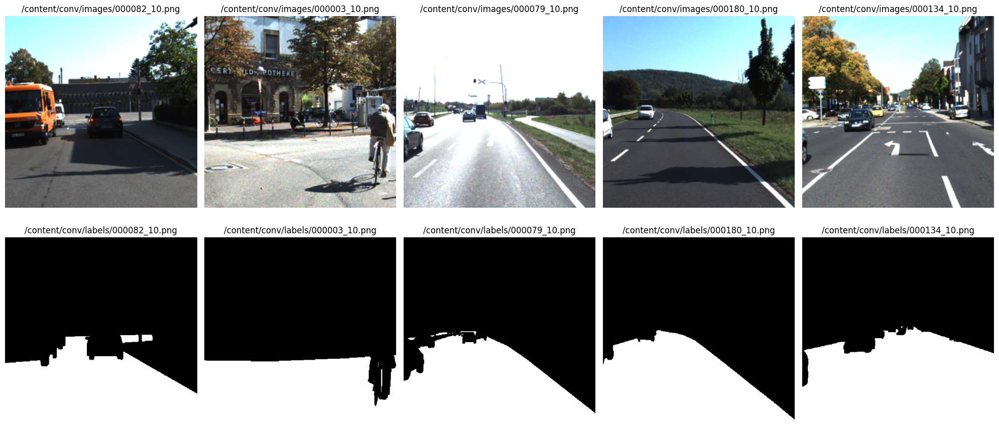

In [8]:
images_dir = Path("/content/conv/images")
labels_dir = Path("/content/conv/labels")

image_files = [p for p in images_dir.glob("*.png")]
label_files = [p for p in labels_dir.glob("*.png")]
fig, axs = plt.subplots(2, 5, figsize=(20, 10), tight_layout=True)
for i in range(5):
  img = cv2.cvtColor(cv2.imread(str(image_files[i])), cv2.COLOR_BGR2RGB)
  axs[0, i].imshow(img)
  axs[0, i].axis("off")
  axs[0, i].set_title(str(image_files[i]))
  lbl = cv2.imread(str(label_files[i]))
  axs[1, i].imshow(lbl * 255)
  axs[1, i].axis("off")
  axs[1, i].set_title(str(label_files[i]))


lastly, change the dataset structure to be like the one supported by mmseg

In [9]:
def prepare_dataset(
  images_dir: Path,
  labels_dir: Path,
  dataset_dir: Path,
  val_ratio: float = 0.1,
):
  """
  Construct the final dataset. Takes images from the
  images_dir and labels from labels_dir, split them
  to val and train set with val set is val_ratio of
  the total data. Then save the results to dataset_dir
  with the correct Cityscapes structure.
  """
  shutil.rmtree(dataset_dir, ignore_errors=True)
  images = list(images_dir.glob("*.png"))
  images = [img.stem for img in images]

  random.shuffle(images)
  val_number = int(len(images) * val_ratio)
  val_images = images[:val_number]
  train_images = images[val_number:]

  dataset_images_dir_val = dataset_dir / "leftImg8bit" / "val"
  dataset_images_dir_train = dataset_dir / "leftImg8bit" / "train"
  dataset_labels_dir_val = dataset_dir / "gtFine" / "val"
  dataset_labels_dir_train = dataset_dir / "gtFine" / "train"

  dataset_images_dir_val.mkdir(parents=True, exist_ok=True)
  for img in val_images:
    shutil.copy(
      images_dir / f"{img}.png",
      dataset_images_dir_val / f"{img}_leftImg8bit.png",
    )
  print(f"Val images: {len(os.listdir(dataset_images_dir_val))}")

  dataset_images_dir_train.mkdir(parents=True, exist_ok=True)
  for img in train_images:
    shutil.copy(
      images_dir / f"{img}.png",
      dataset_images_dir_train / f"{img}_leftImg8bit.png",
    )
  print(f"Train images: {len(os.listdir(dataset_images_dir_train))}")

  dataset_labels_dir_val.mkdir(parents=True, exist_ok=True)
  for img in val_images:
    shutil.copy(
      labels_dir / f"{img}.png",
      dataset_labels_dir_val / f"{img}_gtFine_labelTrainIds.png",
    )
  print(f"Val labels: {len(os.listdir(dataset_labels_dir_val))}")

  dataset_labels_dir_train.mkdir(parents=True, exist_ok=True)
  for img in train_images:
    shutil.copy(
      labels_dir / f"{img}.png",
      dataset_labels_dir_train / f"{img}_gtFine_labelTrainIds.png",
    )
  print(f"Train labels: {len(os.listdir(dataset_labels_dir_train))}")

In [10]:
prepare_dataset(
  Path("/content/conv/images"),
  Path("/content/conv/labels"),
  Path("/content/data/cityscapes"),
)

Val images: 20
Train images: 180
Val labels: 20
Train labels: 180


you will se the dataset in `data` directory

## Step 3. Run Training

Please do training with the following specification:

1. Use PIDNet-S model, because it is small and quite accurate for its size
2. The image input for the training is 384x384
3. Use tensorboard visualizaition (ask google how to use tensorboard in mmsegmentation)
4. Do some experiment. Run multiple traings by varying one of the hyperparameters (number of iterations, batch size, learning rate, or others)achieve accuracy and mIoU as high as you can! Run at least 3 trainings.

**Once a training is finished, save your `work_dir` (save to GDrive, you can delete all `.pth` models except the last one), the directory contains tensorboard log. Later when all trainings have been finished. Combine all work_dir-s and visualize the training plots in one graph. It will help your analysis**

What to submit, for each training experiment:

1. The `work_dir`. It includes the config `.py` file and the latest iter model `.pth` file. Note that to save disk space, please remove other `.pth` files
2. Screenshot of the `loss`, `mIoU` and `mAcc` in the tensorboard that shows all your experiments.
3. When finished training, copy all of the terminal output of the training cell, save them as a text file
4. Your analysis based on the final accuracy and tensorboard plot, can be written in word file or any other format.

**Important: before start the training, we need to change the class names of the Cityscapes**

Open `mmsegmentation/mmseg/datasets/cityscapes.py` and change the `METAINFO` to

```
    METAINFO = dict(
        classes=('background', 'road'),
        palette=[[128, 64, 128], [244, 35, 232]])
```

and then restart the session (without disconnect/delete runtime)

Now, let's move on to the configuration. OpenMMLab's projects, including mmsegmentation, use configuration files to configure everything, from the model to the training.

By default, the configurations are splitted into several parts (read mmsegmentation documentation for details), so it is hard to get the whole picture of the configuration. For example, the config for the PIDNet-S can be found in `mmsegmentation/configs/pidnet/pidnet-s_2xb6-120k_1024x1024-cityscapes.py`

Luckily, mmsegmentation already provide a script that can combine all scattered configs into one `.py` config file.

Now run the following cell, you will see the unified config file of PIDNet-S in `example.py`. Modify the configuration and try to run the training!

In [11]:
!pip install tensorboardX future tensorboard

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 101.7/101.7 kB 3.2 MB/s eta 0:00:00


In [12]:
!python /content/mmsegmentation/tools/misc/print_config.py /content/mmsegmentation/configs/pidnet/pidnet-s_2xb6-120k_1024x1024-cityscapes.py

Config:
checkpoint_file = 'https://download.openmmlab.com/mmsegmentation/v0.5/pretrain/pidnet/pidnet-s_imagenet1k_20230306-715e6273.pth'
class_weight = None
crop_size = (
    1024,
    1024,
)
data_preprocessor = dict(
    bgr_to_rgb=True,
    mean=[
        123.675,
        116.28,
        103.53,
    ],
    pad_val=0,
    seg_pad_val=255,
    size=(
        1024,
        1024,
    ),
    std=[
        58.395,
        57.12,
        57.375,
    ],
    type='SegDataPreProcessor')
data_root = 'data/cityscapes/'
dataset_type = 'CityscapesDataset'
default_hooks = dict(
    checkpoint=dict(by_epoch=False, interval=300, type='CheckpointHook'),
    logger=dict(interval=50, log_metric_by_epoch=False, type='LoggerHook'),
    param_scheduler=dict(type='ParamSchedulerHook'),
    sampler_seed=dict(type='DistSamplerSeedHook'),
    timer=dict(type='IterTimerHook'),
    visualization=dict(type='SegVisualizationHook'))
default_scope = 'mmseg'
env_cfg = dict(
    cudnn_benchmark=True,
    dist_cfg=dic

In [16]:
%reload_ext tensorboard
%tensorboard --logdir "/content/work_dir"

<IPython.core.display.Javascript object>

In [15]:
# you can change the path to the config file /content/example.py
!python /content/mmsegmentation/tools/train.py \
  /content/example.py \
  --work-dir /content/work_dir

01/14 16:02:17 - mmengine - INFO - 
------------------------------------------------------------
System environment:
    sys.platform: linux
    Python: 3.10.12 (main, Nov 20 2023, 15:14:05) [GCC 11.4.0]
    CUDA available: True
    numpy_random_seed: 304
    GPU 0: Tesla T4
    CUDA_HOME: /usr/local/cuda
    NVCC: Cuda compilation tools, release 12.2, V12.2.140
    GCC: x86_64-linux-gnu-gcc (Ubuntu 11.4.0-1ubuntu1~22.04) 11.4.0
    PyTorch: 2.1.0+cu121
    PyTorch compiling details: PyTorch built with:
  - GCC 9.3
  - C++ Version: 201703
  - Intel(R) oneAPI Math Kernel Library Version 2022.2-Product Build 20220804 for Intel(R) 64 architecture applications
  - Intel(R) MKL-DNN v3.1.1 (Git Hash 64f6bcbcbab628e96f33a62c3e975f8535a7bde4)
  - OpenMP 201511 (a.k.a. OpenMP 4.5)
  - LAPACK is enabled (usually provided by MKL)
  - NNPACK is enabled
  - CPU capability usage: AVX2
  - CUDA Runtime 12.1
  - NVCC architecture flags: -gencode;arch=compute_50,code=sm_50;-gencode;arch=compute_60,code